<a href="https://colab.research.google.com/github/epacioga21/Dog-Breed-Recognition-Android-App/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End to end multiclass Dog Breed Classification

This notebook builds an end to end multiclass image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1.Problem
  Identifying the breed of a dog given an image of it.

## 2.Data
The data we are using is from Kaggle: https://www.kaggle.com/c/dog-breed-identification/overview

## 3.Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image: www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4.Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best to use deep learning/transfer learning
* There are 120 breeds of dogs (120 different classes)
* There are aroung 10000+ images in the training and test set



### Get our workspace ready

In [ ]:
# Import TensorFlow into Colab

import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.18.0


In [ ]:
 # Import TensorFlow Hub

import tensorflow_hub as hub
print("TF version: ", hub.__version__)

TF version:  0.16.1


In [ ]:
# Check for GPU availability

print("GPU", "Available" if tf.config.list_physical_devices("GPU") else "Not Available")

GPU Not Available


### Getting our data ready (turning it into tensors)

With all machine learning models, our data has to be in numerical format

In [ ]:
#Check out the labels of our data

import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

<Axes: xlabel='breed'>

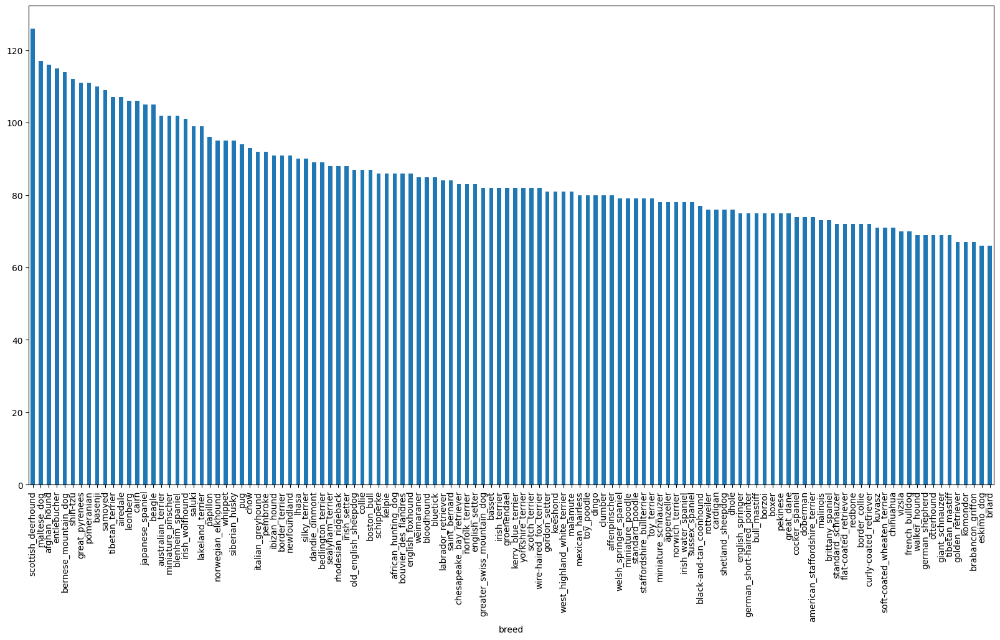

In [ ]:
 # How many images are there of each breed?

 labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

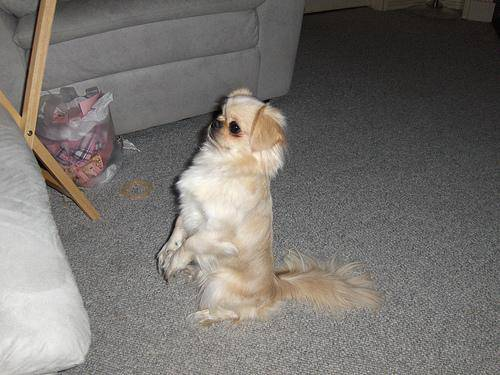

In [ ]:
#Let's view an image

from IPython.display import Image
Image("/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg")

### Getting images and their labels

Let's get a list of all of our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's

filenames = ["drive/MyDrive/Dog Vision/train/" + fname for fname in labels_csv["id"] + ".jpg"]

# Check filenames
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check if the number of filenames is equal to the number of actual files

import os

if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files")
else:
  print("Filenames dont match the amount of files")

Filenames match actual amount of files


Since we've got our filepath in a list, let's prepare the labels

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels[:10]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [ ]:
len(labels)


10222

In [ ]:
# Check if number of labels matches number of filenames

if len(labels) == len(filenames):
   print("Match")
else:
  print("Dont match")

Match


In [ ]:
# Find the unique label values
import numpy as np
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Creating our own validation set

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

We're going to start off experimenting 1000 images and increase as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

### Preprocessing images(Turning images into Tensors)

To preprocess our images into tensor we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it in a variable, `image`
3. Turn `image` into Tensors
4. Normalize our `image` (convert color channel values from 0-255 to 0-1)
5. Resize `image` to be a shape of (224, 224)
6. Return the modified `image`

In [ ]:
# Convert an image into an numpy array

from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing:

def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image path and turns it into a Tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpg image into numerical Tensor with 3 color channels
  image = tf.image.decode_jpeg(image, channels = 3)
  # Convert the color channels values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

### Turning our data into batches

In [ ]:
# Create a simple function to return a tuple (image, label)

def get_image_label(image_path, label):
  """
  Takes an image path name and its assosciated label, processes the image and returns a tuple (image, label)
  """
  image = process_image(image_path)
  return image, label

Now we've got a way to turn our data into tuples of tensors in the form: `(image, label)`
let's make a function to turn all of our data into batches

In [ ]:
# Define the batch size
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label  (y) pairs, it shuffles the data
  if it's training data but doesn't shuffle if it's validation data. Also accepts test
  data as input.
  """
  # If the data is the test dataset, we probably dont have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is the valid dataset we dont need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepaths
                                               tf.constant(y))) # labels

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels befor mapping image processor function is
    # faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuple
    data = data.map(get_image_label)

    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Checkout the different attribute of the datasets
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches

Our data is now in batches, however these can be a little hard to undestand, lets
visualize them

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their label from a batch
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # loop through 25(for displaying 25 images)
  for i in range(25):
    # Create subplots
    ax = plt.subplot(5,5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the gridlines off
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())

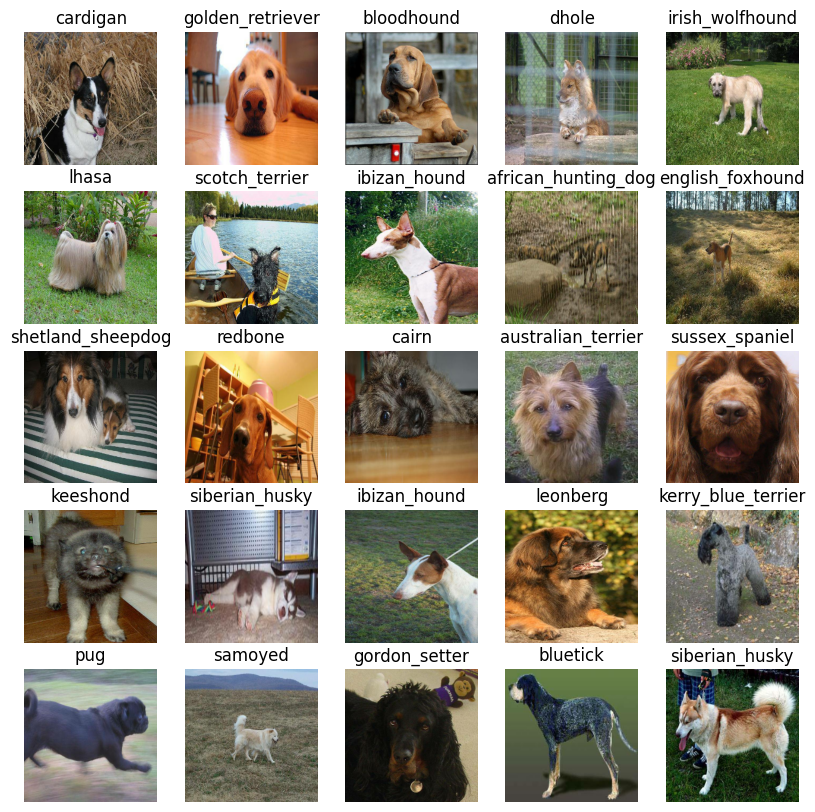

In [ ]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

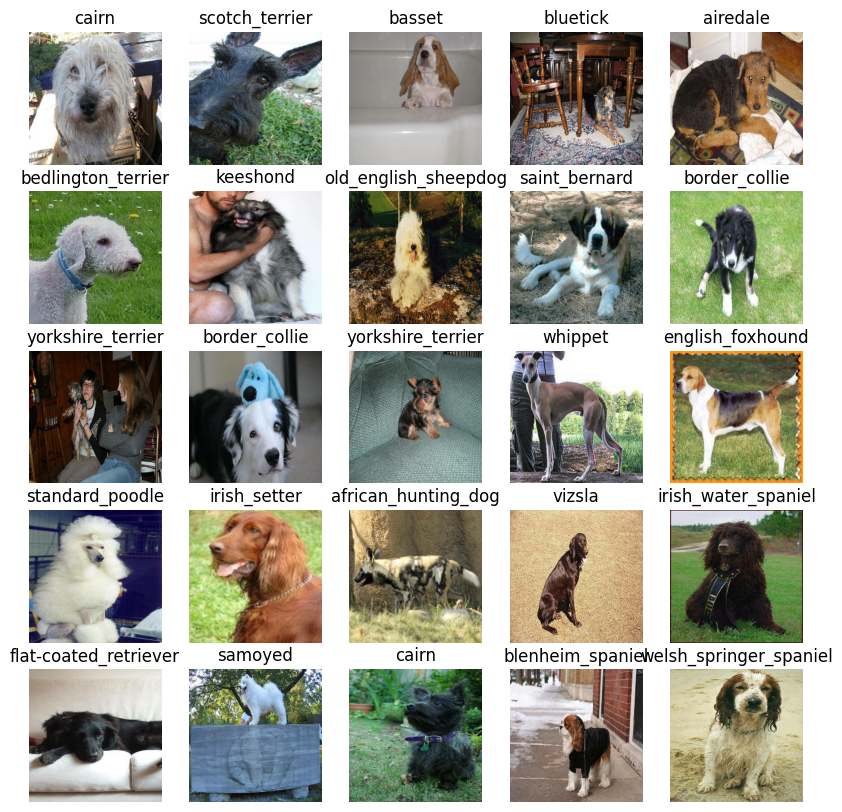

In [ ]:
 # Now let's visualize a validation batch

val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

### Building a model

* Checking the input form(Tensors)
* Defining the output form(Tensors)
* Getting the URL of the model we want to use

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

# Setup output shape of the model
OUTPUT_SHAPE =  len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5"

In [ ]:
# Let's create a model that builds a Keras model

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", model_url)

  #Setup model layers
  hub_layer = hub.KerasLayer(model_url)

  model = tf.keras.Sequential([
    hub_layer, #layer1 - input
    tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax"), #layer2 - output
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  model.build(input_shape=INPUT_SHAPE)

  return model

NameError: name 'INPUT_SHAPE' is not defined

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1664)              3766048   
                                                                 
 dense (Dense)               (None, 120)               199800    
                                                                 
Total params: 3965848 (15.13 MB)
Trainable params: 199800 (780.47 KB)
Non-trainable params: 3766048 (14.37 MB)
_________________________________________________________________


In [ ]:
#!pip install tensorflow==2.15.0 tensorflow-hub keras==2.15.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 4.3 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of tf-keras to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.3/475.3 MB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 75.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 55.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 98.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 22.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 102.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 28.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 54.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.4/78.4 kB 6.2 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrap

### Creating callbacks

In [ ]:
# TensorBoard Callback
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

#### Early Stopping Callback

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                    patience=3)

### Training a model (on a subset of data)

Our first model is going to train on only 1000 images, to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 #@param {type: "slider", min:10 ,max:100, step:10}

Let's create a function which trains a model

* Create a model using `create_model()`
* Setup a TensorBoard callback
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs and the callbacks
* Return the model

In [ ]:
# Build a function to train and return a model
def train_model():
  """
  Trains given model and returns the trained version
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard callback
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
#Fit the trained model
# model = train_model()

### Checking the TensorBoard logs

In [ ]:
# %tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

### Making and evaluating predictions using a trained model

In [ ]:
# make predicitons on the validation data
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 282s 47s/step


array([[0.00417326, 0.00326255, 0.01543059, ..., 0.00519009, 0.00689987,
        0.00349471],
       [0.00567344, 0.00683083, 0.01609296, ..., 0.00264051, 0.00690317,
        0.00551398],
       [0.0159975 , 0.00481908, 0.00348899, ..., 0.00565397, 0.00427289,
        0.00179214],
       ...,
       [0.0069076 , 0.02352022, 0.00624949, ..., 0.00326436, 0.0125965 ,
        0.00387958],
       [0.008164  , 0.00686451, 0.01256604, ..., 0.00214952, 0.00517954,
        0.0017807 ],
       [0.00671392, 0.01091937, 0.01684079, ..., 0.00388   , 0.00259874,
        0.00122412]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
#First Prediction
index = 32
print(predictions[index])
print(f"Max value(probability): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[0.00604913 0.01691235 0.00524539 0.01496024 0.00182013 0.01840401
 0.00495203 0.0036514  0.00561299 0.00827209 0.00818349 0.00227756
 0.00847199 0.00226151 0.00145908 0.00159353 0.00205548 0.00611649
 0.01097453 0.00292186 0.0094122  0.00248709 0.00243776 0.00738528
 0.02022796 0.00606765 0.00538124 0.00640451 0.00363908 0.00414944
 0.01408835 0.00910413 0.00536043 0.00985855 0.01414741 0.00181085
 0.0055084  0.00146727 0.00239717 0.01140544 0.00622866 0.00282241
 0.00385854 0.02285425 0.00800706 0.01614917 0.01157269 0.02166051
 0.00845677 0.01248319 0.00325691 0.00622936 0.00442988 0.00280251
 0.00127615 0.00602434 0.0102364  0.00571914 0.00641308 0.00539941
 0.00395162 0.00320504 0.00307888 0.01105395 0.00752472 0.00615034
 0.00848782 0.00793238 0.03110635 0.00660866 0.01912411 0.04018702
 0.00686115 0.01727198 0.01082996 0.0474333  0.00271136 0.00071234
 0.02963658 0.0022647  0.00692893 0.0159916  0.00375438 0.00503109
 0.00584131 0.0022028  0.01156645 0.00593009 0.00108877 0.0023

In [ ]:
# Turn prediction probabilities into their respective label
def get_pred_label(probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(probabilities)]

#pred_label = get_pred_label(predictions[81])
#pred_label

In [ ]:
# Create a function to unbatch a batch data set
def unbatchify(data_batch):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels
  """
  images = []
  labels = []

  for image, label in data_batch.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

# Unbatchify the validation data
# val_images, val_labels = unbatchify(val_data)
# val_images[0], val_labels[0]

In [ ]:
def plot_pred(probabilites, labels, images, n=1):
  """
  VIew the prediction, label and image for sample n
  """
  pred_prob, true_label, image = probabilites[n], labels[n], images[n]
  pred_label = get_pred_label(pred_prob)

  #Plot image and remove tickes
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"


  plt.title("{} {:2.0f} {}".format(pred_label,
                                   np.max(pred_prob)*100,
                                   true_label),
            color=color)

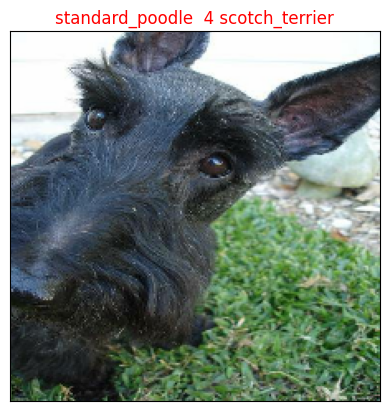

In [ ]:
plot_pred(predictions, val_labels, val_images)

In [ ]:
def plot_pred_conf(probabilities, labels, n=1):
  """
  Plot the top 10 highet prediction probabilities and predicted labels for sample n
  """
  pred_prob, true_label = probabilities[n], labels[n]

  #Get the predicted labels
  pred_label = get_pred_label(pred_prob)

  #Find the top 10 prediction confidences indexes
  top_10_indexes = pred_prob.argsort()[-10:][::-1]

  #Find the top 10 prediction confidences values
  top_10_values = pred_prob[top_10_indexes]

  #Find the top 10 prediction confidences labels
  top_10_labels = unique_breeds[top_10_indexes]

  #Setup plot
  top_plot = plt.bar(np.arange(len(top_10_labels)),
                     top_10_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_labels)),
             labels = top_10_labels,
             rotation = "vertical")

  if np.isin(true_label, top_10_labels):
    top_plot[np.argmax(top_10_labels == true_label)].set_color("green")
  else:
    pass

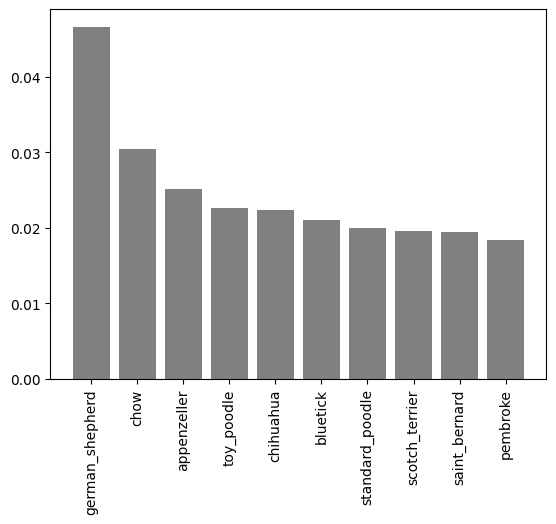

In [ ]:
plot_pred_conf(predictions, val_labels, n=9)

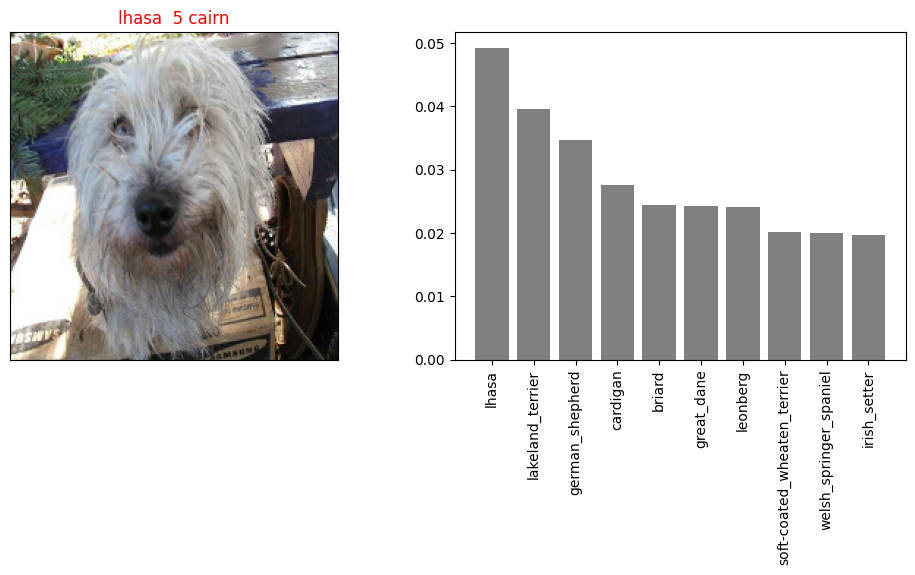

<ipython-input-53-abec4b49556c>:11: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout(h_pad=2.0)


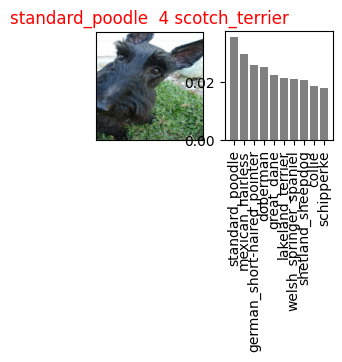

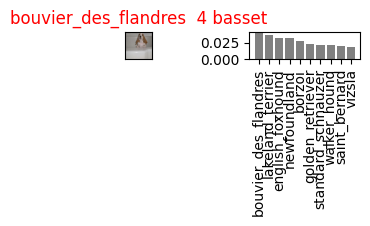

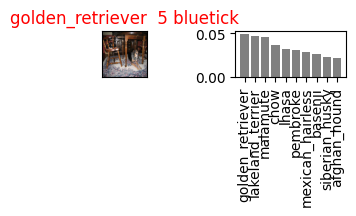

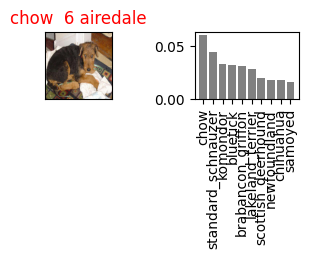

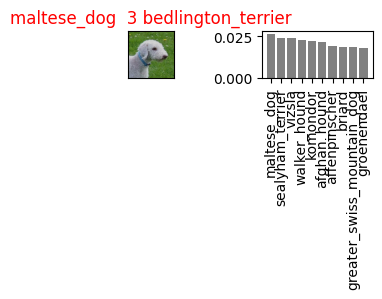

In [ ]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions, val_labels, val_images, i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions, val_labels,i+i_multiplier)
  plt.tight_layout(h_pad=2.0)
  plt.show()

### Saving and reloading a model

In [ ]:
#Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a model directory and appends a suffix
  """
  #Create a models directory pathname with the current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models", datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" #save format of model
  print(f"Saving model to {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
#Create a function to load model
def load_model(model_path):
  """
  Loads saved model from a specified path
  """
  print(f"Loads model from {model_path}")
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
#Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

In [ ]:
#Load trained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog Vision/models/20250225-18101740507006-1000-images-mobilenetv2-Adam.h5")

Loads model from drive/MyDrive/Dog Vision/models/20250225-18101740507006-1000-images-mobilenetv2-Adam.h5


### Training on the whole dataset

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
full_model_earlystopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                            patience=3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_earlystopping])

Epoch 1/100
320/320 [==============================] - 437s 1s/step - loss: 1.2788 - accuracy: 0.6874
Epoch 2/100
320/320 [==============================] - 444s 1s/step - loss: 0.3791 - accuracy: 0.8924
Epoch 3/100
320/320 [==============================] - 446s 1s/step - loss: 0.2255 - accuracy: 0.9429
Epoch 4/100
320/320 [==============================] - 478s 1s/step - loss: 0.1444 - accuracy: 0.9702
Epoch 5/100
320/320 [==============================] - 449s 1s/step - loss: 0.0971 - accuracy: 0.9858
Epoch 6/100
320/320 [==============================] - 437s 1s/step - loss: 0.0702 - accuracy: 0.9919
Epoch 7/100
320/320 [==============================] - 449s 1s/step - loss: 0.0521 - accuracy: 0.9958
Epoch 8/100
320/320 [==============================] - 443s 1s/step - loss: 0.0410 - accuracy: 0.9971
Epoch 9/100
320/320 [==============================] - 442s 1s/step - loss: 0.0322 - accuracy: 0.9984
Epoch 10/100
320/320 [==============================] - 445s 1s/step - loss: 0.026

In [ ]:
save_model(full_model, suffix="full_image_set_mobilenetv2_adam")

Saving model to drive/MyDrive/Dog Vision/models/20250304-16011741104112-full_image_set_mobilenetv2_adam.h5...


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20250304-16011741104112-full_image_set_mobilenetv2_adam.h5'

### Making predictions on custom photos

In [ ]:
#Load trained model
loaded_full_image_model = load_model("drive/MyDrive/Dog Vision/models/20250304-16011741104112-full_image_set_mobilenetv2_adam.h5")

Loads model from drive/MyDrive/Dog Vision/models/20250304-16011741104112-full_image_set_mobilenetv2_adam.h5


In [ ]:
d# Get custom photos filepath
import os
custom_path = "drive/MyDrive/Dog Vision/myphotos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['drive/MyDrive/Dog Vision/myphotos/123.jpeg',
 'drive/MyDrive/Dog Vision/myphotos/bella.jpeg',
 'drive/MyDrive/Dog Vision/myphotos/pichs.jpeg',
 'drive/MyDrive/Dog Vision/myphotos/481956241_661614873002403_2992442978175114808_n.jpg',
 'drive/MyDrive/Dog Vision/myphotos/481939382_616510047907352_3218686571114208_n.jpg',
 'drive/MyDrive/Dog Vision/myphotos/482266309_669889342144629_7364657037809188902_n.jpg',
 'drive/MyDrive/Dog Vision/myphotos/WhatsApp Image 2025-03-04 at 18.50.46.jpeg',
 'drive/MyDrive/Dog Vision/myphotos/WhatsApp Image 2025-03-04 at 18.50.47 (3).jpeg',
 'drive/MyDrive/Dog Vision/myphotos/WhatsApp Image 2025-03-04 at 18.50.47 (1).jpeg',
 'drive/MyDrive/Dog Vision/myphotos/WhatsApp Image 2025-03-04 at 18.50.47 (2).jpeg',
 'drive/MyDrive/Dog Vision/myphotos/WhatsApp Image 2025-03-04 at 18.51.31.jpeg',
 'drive/MyDrive/Dog Vision/myphotos/WhatsApp Image 2025-03-04 at 18.54.38.jpeg',
 'drive/MyDrive/Dog Vision/myphotos/WhatsApp Image 2025-03-04 at 18.54.38 (1).jpeg',
 'dri

In [ ]:
# Turn custom photos into data batches
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
#Make predictions
custom_preds = loaded_full_image_model.predict(custom_data)

1/1 [==============================] - 6s 6s/step


In [ ]:
# Get custom images predicted labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['doberman',
 'chihuahua',
 'cardigan',
 'italian_greyhound',
 'whippet',
 'sealyham_terrier',
 'kelpie',
 'pomeranian',
 'eskimo_dog',
 'samoyed',
 'pomeranian',
 'mexican_hairless',
 'kelpie',
 'norwegian_elkhound',
 'redbone',
 'redbone']

In [ ]:
# Get custom images
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

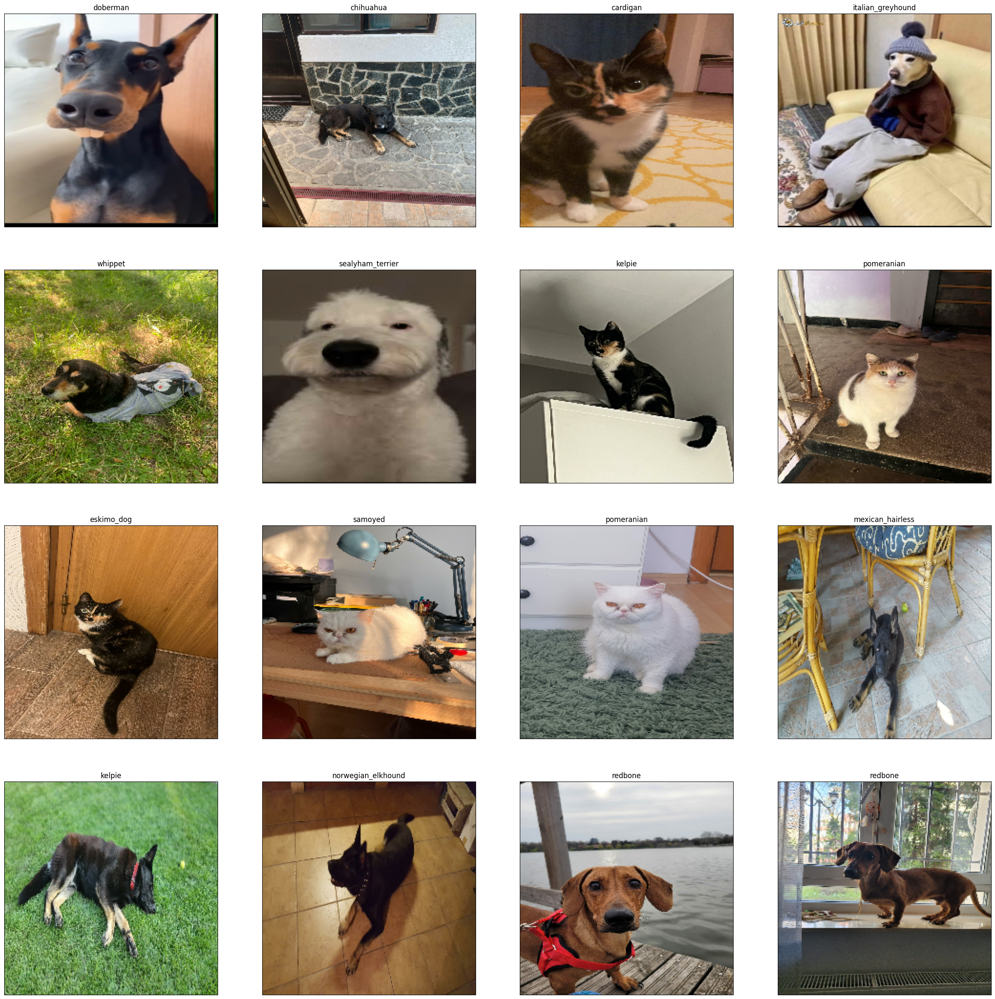

In [ ]:
# Check custom image predictions
plt.figure(figsize=(30, 30))
for i, image in enumerate(custom_images):
  # Calculate the row and column position for each image
  row = i // 4 + 1  # Divide index by 4 (number of columns) and add 1 for row number
  col = i % 4 + 1  # Remainder when divided by 4 gives column number

  plt.subplot(4, 4, i + 1)  # 4 rows, 4 columns, index starts at 1
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)